In [33]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif'] = ['Times New Roman']
plt.rcParams['figure.dpi'] = 500
plt.rcParams['text.color'] = 'w'
# plt.rcParams['axes.labelcolor'] = 'k'
plt.rcParams['xtick.color'] = 'w'
plt.rcParams['ytick.color'] = 'w'
plt.rcParams['axes.edgecolor'] = 'w'
plt.rcParams['figure.facecolor'] = 'k'
plt.rcParams['axes.facecolor'] = 'k'
plt.rcParams['axes.labelcolor'] = 'w'
plt.rcParams['legend.labelcolor'] = 'w'
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.colors import LogNorm
from matplotlib.patches import FancyArrowPatch
import matplotlib.colors as colors
from astropy.visualization import SqrtStretch, LinearStretch, LogStretch
from astropy.visualization.mpl_normalize import ImageNormalize
import pandas as pd
import plotly.express as px
import plotly.io as pio
import re
from astropy.io import fits
import os
from scipy.ndimage import map_coordinates
from scipy.stats import binned_statistic
from scipy.spatial.distance import cdist
from scipy.optimize import linear_sum_assignment
from pathlib import Path
from scipy.stats import gaussian_kde
import seaborn as sns
import tqdm

from matplotlib.lines import Line2D
os.chdir("/Users/ainsleylewis/Documents/Astronomy/IllustrisTNG Lens Modelling")

In [2]:
columns = ['strength', 'pa', 'num_images', 'pos_rms', 'mag_rms', 't_mpole_str', 't_mpole_pa', 'chi2', 'z', 'x', 'y', 'e', 'pow_pa', 'r_ein', 'pwi']
df = pd.read_csv('/Users/ainsleylewis/Documents/Astronomy/IllustrisTNG Lens Modelling/Test/Sim 8_summary.csv', header=None, names=columns, skiprows=1) 
df

,strength,pa,num_images,pos_rms,mag_rms,t_mpole_str,t_mpole_pa,chi2,z,x,y,e,pow_pa,r_ein,pwi
0,0.001,0.00000,1,0.032746,5.658633e+06,0.000163,-6.996308,586.864500,1.0,20.80811,20.77515,1.290263e-07,92.714100,0.488098,1.503333
1,0.001,0.36036,0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.0,0.00000,0.00000,0.000000e+00,0.000000,0.000000,0.000000
2,0.001,0.72072,0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.0,0.00000,0.00000,0.000000e+00,0.000000,0.000000,0.000000
3,0.001,1.08108,1,0.033757,5.226283e+06,0.000114,7.344973,586.457400,1.0,20.80800,20.77518,8.357626e-08,87.839370,0.487912,1.500765
4,0.001,1.44144,0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.0,0.00000,0.00000,0.000000e+00,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999995,0.100,358.55856,4,0.000031,5.643050e+00,0.176100,325.683900,0.000002,1.0,20.83068,20.79598,5.050464e-01,-3.795002,0.494889,2.477233
999996,0.100,358.91892,4,0.000031,9.254275e+00,0.102399,301.938300,0.000004,1.0,20.84812,20.79003,9.881306e-02,-6.652060,0.486099,1.938562
999997,0.100,359.27928,1,0.054763,1.885863e+05,0.000057,359.988400,586.042100,1.0,20.80799,20.77524,2.713273e-05,14.193040,0.487810,1.500191
999998,0.100,359.63964,5,0.000031,7.182635e+01,0.097083,286.769100,0.000003,1.0,20.87048,20.78544,2.864157e-02,-10.101540,0.483096,1.501340


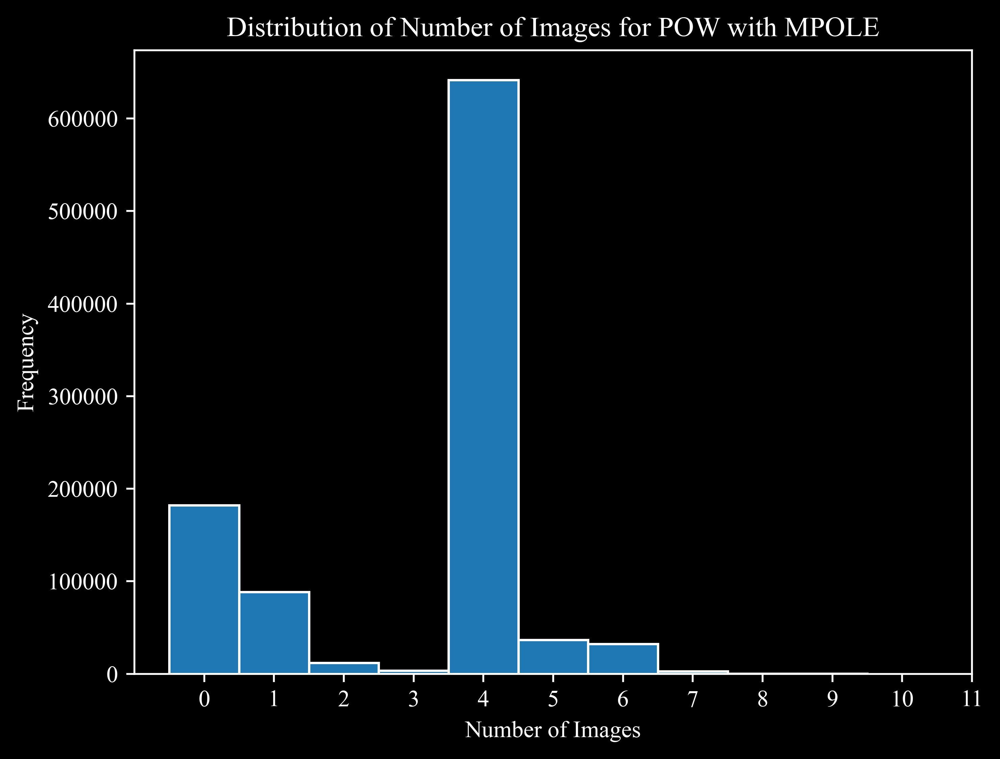

In [3]:
plt.hist(df['num_images'], bins=range(0, 11), align='left', edgecolor='w')
plt.xlabel('Number of Images')
plt.ylabel('Frequency')
plt.title('Distribution of Number of Images for POW with MPOLE')
plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11])
plt.show()

In [4]:
mask = df['num_images'] == 4
filtered_df_0 = df[mask]
filtered_df_0 = filtered_df_0.reset_index(drop=True)

# Precentage of 4 image models 
percentage_4_images = (len(filtered_df_0) / len(df)) * 100
print(f"Percentage of 4 image models: {percentage_4_images:.2f}%")

Percentage of 4 image models: 64.18%


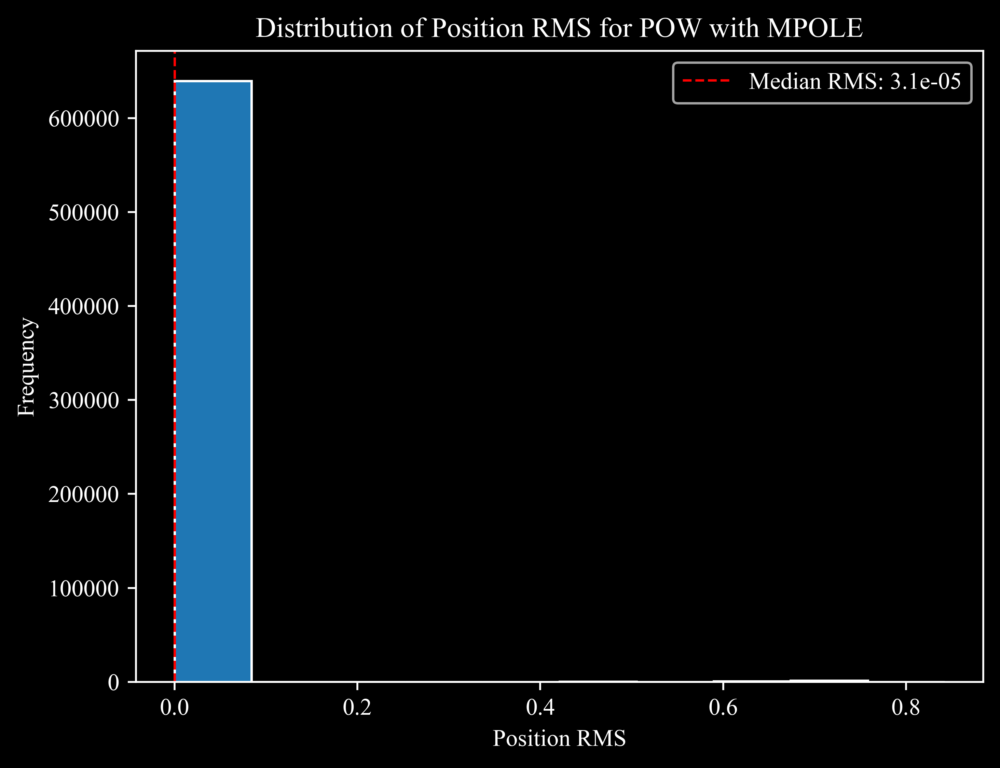

In [5]:
plt.hist(filtered_df_0['pos_rms'], bins=10, edgecolor='w')
plt.axvline(filtered_df_0['pos_rms'].median(), color='r', linestyle='dashed', linewidth=1, label='Median RMS: ' + str(round(filtered_df_0['pos_rms'].median(), 6)))
plt.xlabel('Position RMS')
plt.ylabel('Frequency')
plt.legend()
plt.title('Distribution of Position RMS for POW with MPOLE')
plt.show()

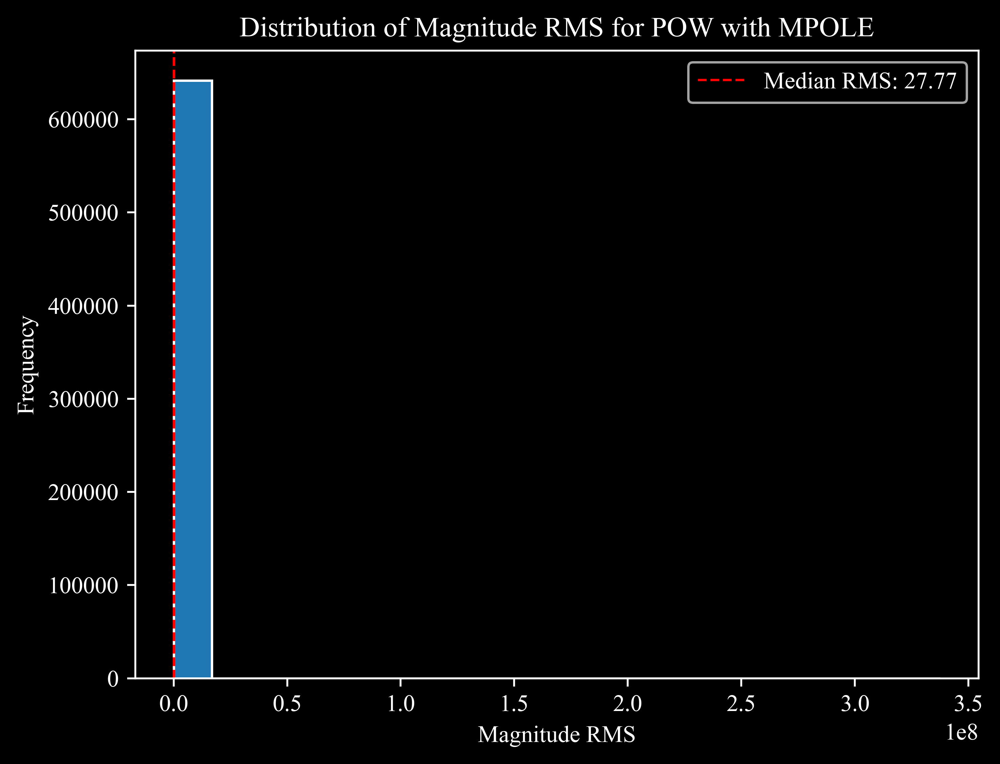

In [6]:
plt.hist(filtered_df_0['mag_rms'], bins=20, edgecolor='w')
plt.axvline(filtered_df_0['mag_rms'].median(), color='r', linestyle='dashed', linewidth=1, label='Median RMS: ' + str(round(filtered_df_0['mag_rms'].median(), 2)))
plt.xlabel('Magnitude RMS')
plt.ylabel('Frequency')
plt.legend()
plt.title('Distribution of Magnitude RMS for POW with MPOLE')
plt.show()

In [7]:
mask2 = filtered_df_0['pos_rms']  == 3.101229586803652e-05
filtered_df = filtered_df_0[mask2]
filtered_df = filtered_df.reset_index(drop=True)
filtered_df

,strength,pa,num_images,pos_rms,mag_rms,t_mpole_str,t_mpole_pa,chi2,z,x,y,e,pow_pa,r_ein,pwi
0,0.001,3.24324,4,0.000031,51.221850,0.083654,-87.32881,0.000003,1.0,20.86061,20.76824,0.036238,175.516600,0.485129,1.588853
1,0.001,9.36937,4,0.000031,18.944500,0.170109,-81.05686,0.000003,1.0,20.88128,20.78238,0.044046,164.357600,0.475550,2.155320
2,0.001,10.45045,4,0.000031,49.599525,0.169648,-86.23385,0.000002,1.0,20.90516,20.77728,0.010393,138.068900,0.469838,1.775327
3,0.001,10.81081,4,0.000031,53.742075,0.172214,-93.38689,0.000002,1.0,20.90880,20.76524,0.002955,84.886440,0.468580,1.763707
4,0.001,12.25225,4,0.000031,22.304550,0.171075,-102.49360,0.000002,1.0,20.88409,20.75667,0.027785,192.714700,0.474010,2.211238
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
532563,0.100,357.83784,4,0.000031,10.768125,0.128714,313.09220,0.000002,1.0,20.85271,20.80941,0.098131,-9.121358,0.482651,1.876337
532564,0.100,358.19820,4,0.000031,21.212200,0.084417,283.70710,0.000002,1.0,20.85180,20.77572,0.063442,-5.399811,0.486328,1.793053
532565,0.100,358.55856,4,0.000031,5.643050,0.176100,325.68390,0.000002,1.0,20.83068,20.79598,0.505046,-3.795002,0.494889,2.477233
532566,0.100,358.91892,4,0.000031,9.254275,0.102399,301.93830,0.000004,1.0,20.84812,20.79003,0.098813,-6.652060,0.486099,1.938562


In [8]:
# Percentage Calc
num_goodfit = len(filtered_df)
num_total = len(df[df['num_images'] == 4])
percentage_goodfit = (num_goodfit / num_total) * 100
print(f"Percentage of good fits out of 4 image models: {percentage_goodfit:.2f}%")

num_goodfit = len(filtered_df)
num_total = len(df)
percentage_goodfit = (num_goodfit / num_total) * 100
print(f"Percentage of good fits: {percentage_goodfit:.2f}%")

Percentage of good fits out of 4 image models: 82.98%
Percentage of good fits: 53.26%


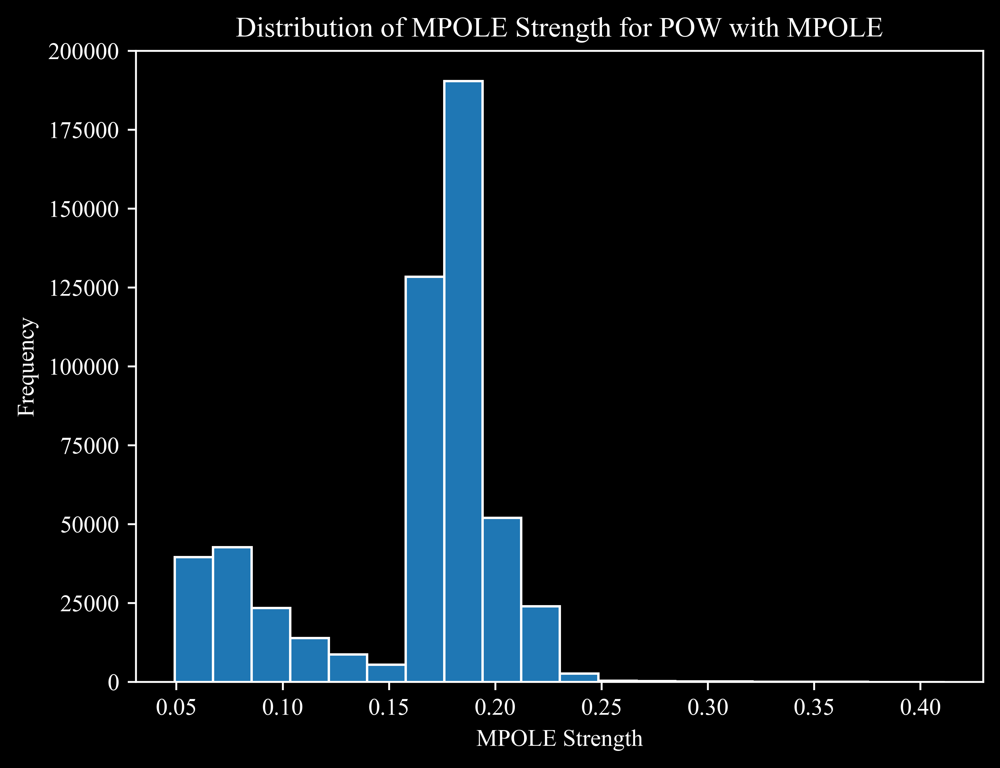

In [13]:
plt.hist(filtered_df['t_mpole_str'], bins=20, edgecolor='w')
plt.xlabel('MPOLE Strength', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of MPOLE Strength for POW with MPOLE')
plt.show()

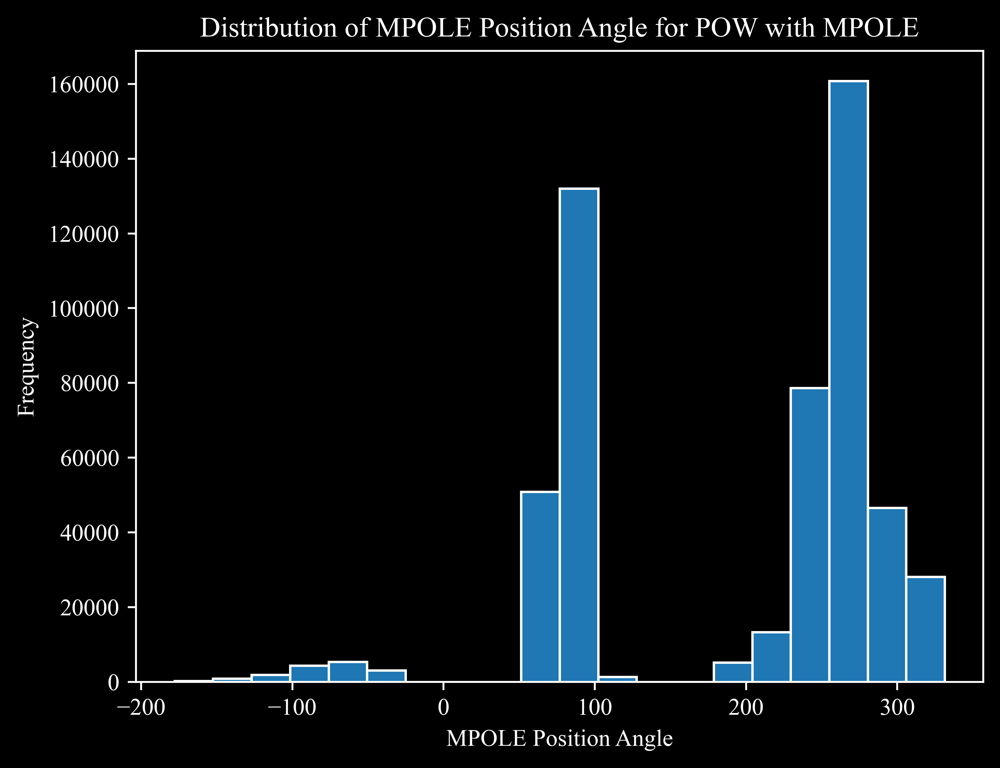

In [14]:
plt.hist(filtered_df['t_mpole_pa'], bins=20, edgecolor='w')
plt.xlabel('MPOLE Position Angle', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of MPOLE Position Angle for POW with MPOLE')
plt.show()

In [15]:
aligned_pa = (filtered_df['t_mpole_pa'] > 100) & (filtered_df['t_mpole_pa'] < 200)
num_aligned = len(filtered_df[aligned_pa])
print(f"Number of aligned MPOLE position angles: {num_aligned}")
anti_aligned_pa = (filtered_df['t_mpole_pa'] < 0) | (filtered_df['t_mpole_pa'] > 200)
print(f"Number of anti-aligned MPOLE position angles: {len(filtered_df[anti_aligned_pa])}")

# Percentage
percentage_aligned = (num_aligned / len(filtered_df)) * 100
print(f"Percentage of aligned MPOLE position angles: {percentage_aligned:.2f}%")
percentage_anti_aligned = (len(filtered_df[anti_aligned_pa]) / len(filtered_df)) * 100
print(f"Percentage of anti-aligned MPOLE position angles: {percentage_anti_aligned:.2f}%")

Number of aligned MPOLE position angles: 5775
Number of anti-aligned MPOLE position angles: 344735
Percentage of aligned MPOLE position angles: 1.08%
Percentage of anti-aligned MPOLE position angles: 64.73%


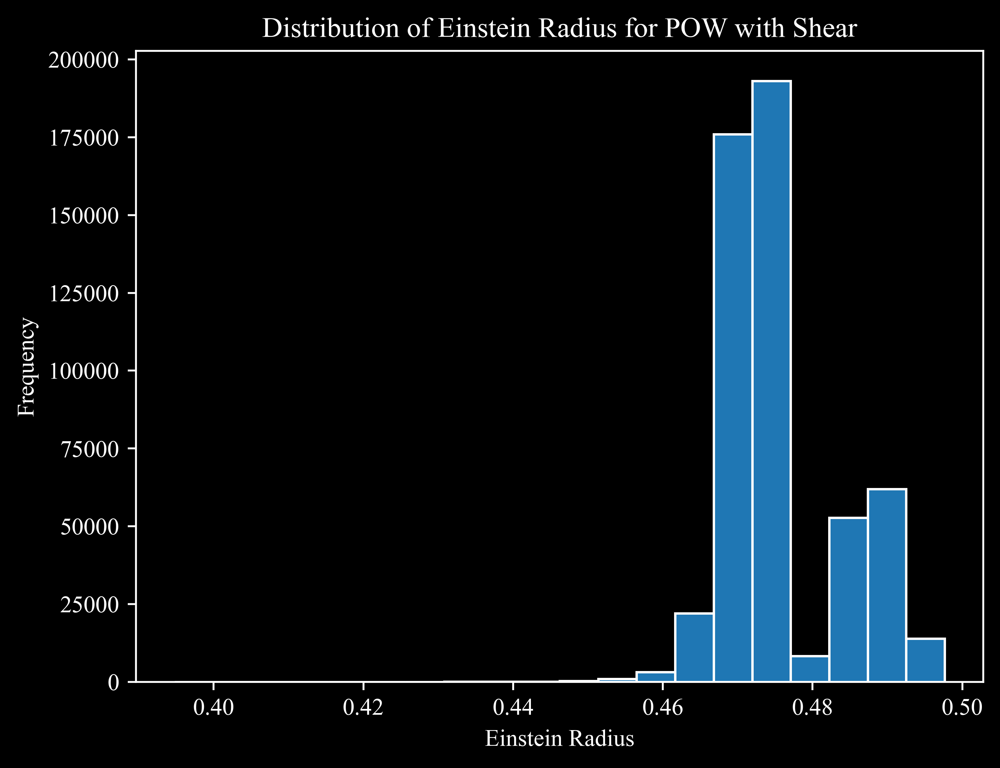

In [16]:
plt.hist(filtered_df['r_ein'], bins=20, edgecolor='w')
plt.xlabel('Einstein Radius', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of Einstein Radius for POW with Shear')
plt.show()

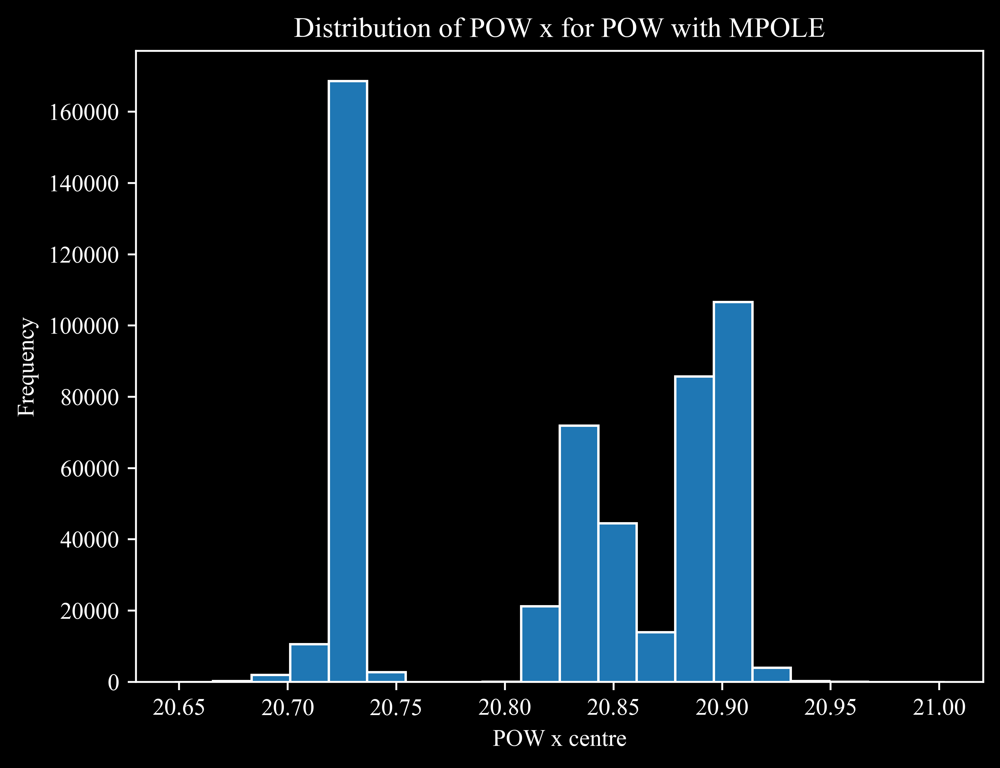

In [17]:
plt.hist(filtered_df['x'], bins=20, edgecolor='w')
plt.xlabel('POW x centre', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of POW x for POW with MPOLE')
plt.show()

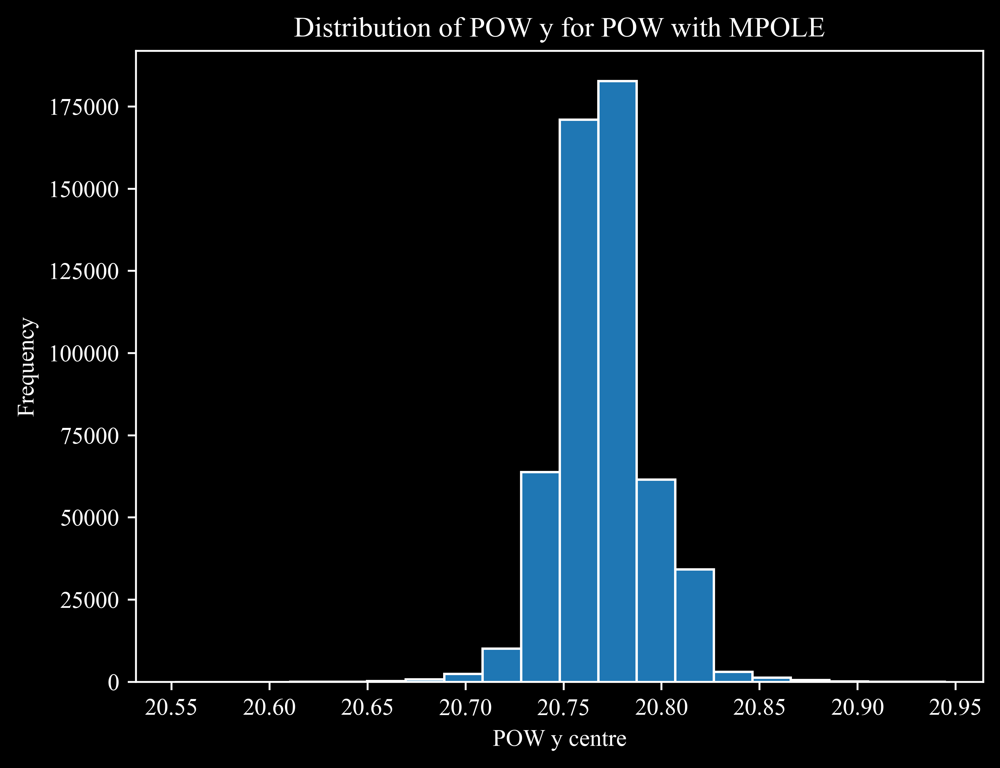

In [18]:
plt.hist(filtered_df['y'], bins=20, edgecolor='w')
plt.xlabel('POW y centre', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of POW y for POW with MPOLE')
plt.show()

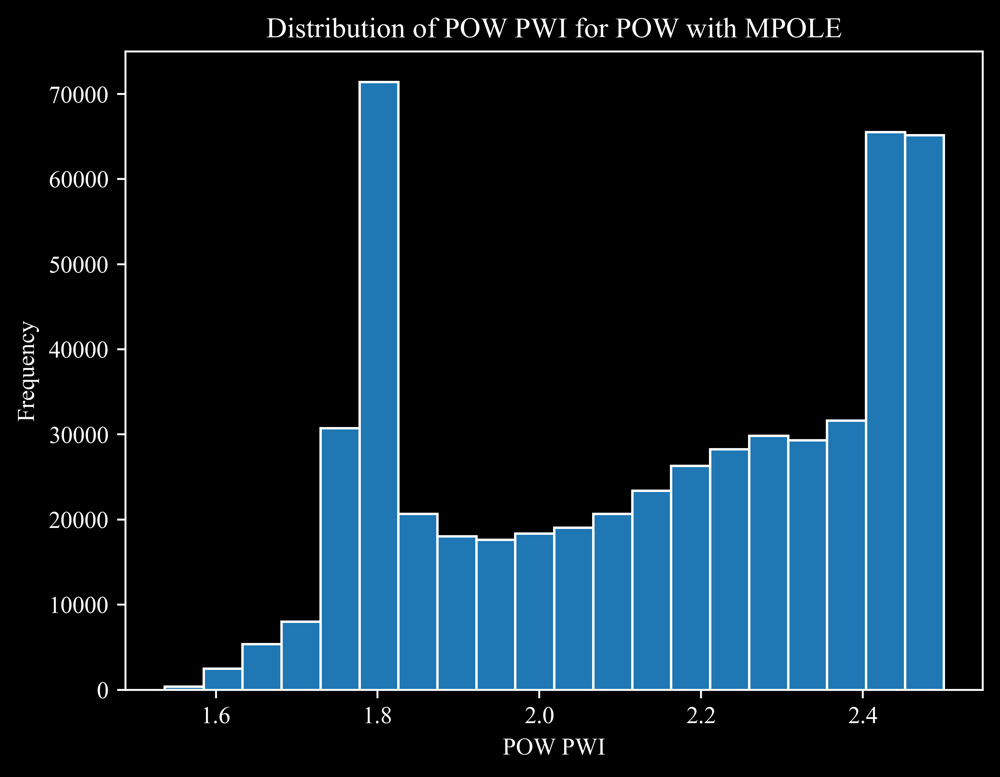

In [19]:
plt.hist(filtered_df['pwi'], bins=20, edgecolor='w')
plt.xlabel('POW PWI', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of POW PWI for POW with MPOLE')
plt.show()

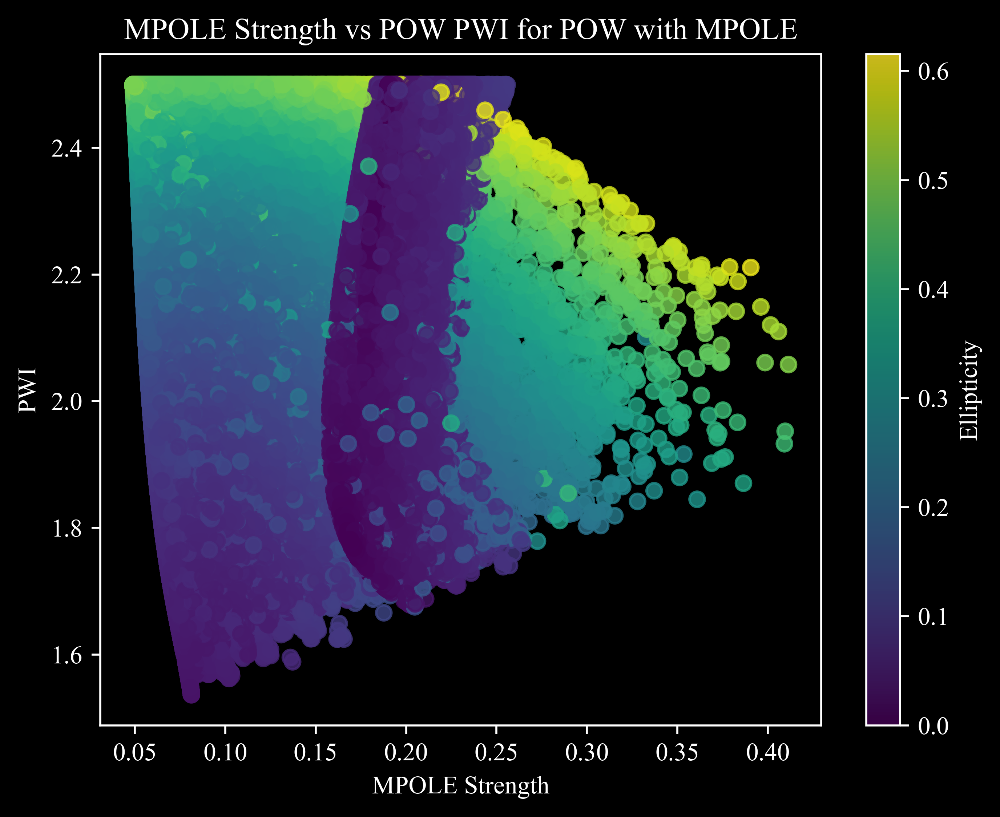

In [22]:
plt.scatter(filtered_df['t_mpole_str'], filtered_df['pwi'], c=filtered_df['e'], alpha=0.8)
plt.colorbar(label='Ellipticity')
plt.xlabel('MPOLE Strength', color = 'w')
plt.ylabel('PWI', color = 'w')
plt.title('MPOLE Strength vs POW PWI for POW with MPOLE')
plt.show()

In [15]:
# # Create the 3D scatter plot using plotly express
# fig = px.scatter_3d(filtered_df, 
#                     x='t_mpole_str', 
#                     y='pwi', 
#                     z='e',
#                     color='e',
#                     opacity=1,
#                     title='MPOLE Strength vs POW PWI vs Ellipticity')

# # Update layout for dark theme, bigger size and smaller points
# fig.update_layout(
#     paper_bgcolor='black',
#     plot_bgcolor='black',
#     scene=dict(
#         xaxis_title='MPOLE Strength',
#         yaxis_title='POW PWI',
#         zaxis_title='Ellipticity',
#         bgcolor='black',
#         xaxis=dict(gridcolor='white', showbackground=False, color='white'),
#         yaxis=dict(gridcolor='white', showbackground=False, color='white'),
#         zaxis=dict(gridcolor='white', showbackground=False, color='white'),
#         aspectmode='cube'
#     ),
#     font=dict(color='white'),
#     width=1200,  # Increase width
#     height=1000  # Increase height
# )

# # Update marker size
# fig.update_traces(marker=dict(size=5))  # Decrease point size
# fig.write_html("/Users/ainsleylewis/Library/CloudStorage/OneDrive-TheUniversityofHongKong-Connect/Weird Plots/plot_1.html")

# fig.show()

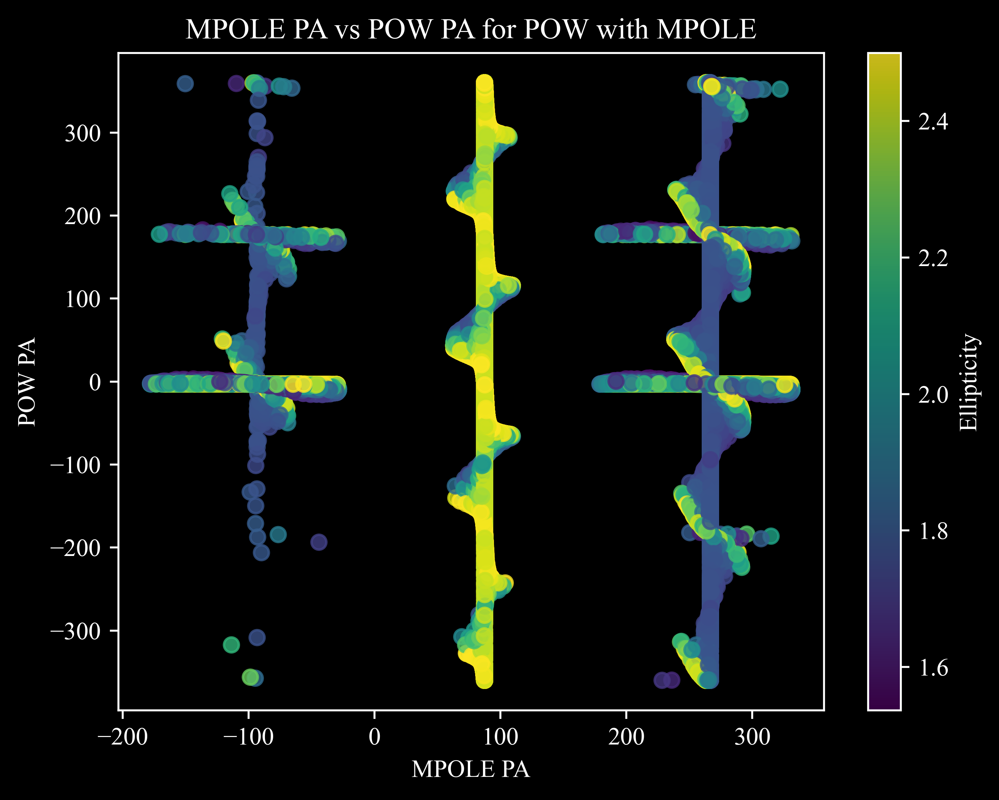

In [9]:
plt.scatter(filtered_df['t_mpole_pa'], filtered_df['pow_pa'], c=filtered_df['pwi'], alpha=0.8)
plt.colorbar(label='Ellipticity')
plt.xlabel('MPOLE PA', color = 'w')
plt.ylabel('POW PA', color = 'w')
plt.title('MPOLE PA vs POW PA for POW with MPOLE')
plt.show()

In [14]:
# # Create the 3D scatter plot using plotly express
# fig = px.scatter_3d(filtered_df, 
#                     x='t_mpole_pa', 
#                     y='pow_pa', 
#                     z='e',
#                     color='e',
#                     opacity=1,
#                     title='MPOLE PA vs POW PA vs Ellipticity')

# # Update layout for dark theme, bigger size and smaller points
# fig.update_layout(
#     paper_bgcolor='black',
#     plot_bgcolor='black',
#     scene=dict(
#         xaxis_title='MPOLE PA',
#         yaxis_title='POW PA',
#         zaxis_title='Ellipticity',
#         bgcolor='black',
#         xaxis=dict(gridcolor='white', showbackground=False, color='white'),
#         yaxis=dict(gridcolor='white', showbackground=False, color='white'),
#         zaxis=dict(gridcolor='white', showbackground=False, color='white'),
#         aspectmode='cube'
#     ),
#     font=dict(color='white'),
#     width=1200,  # Increase width
#     height=1000  # Increase height
# )

# # Update marker size
# fig.update_traces(marker=dict(size=5))  # Decrease point size
# fig.write_html("/Users/ainsleylewis/Library/CloudStorage/OneDrive-TheUniversityofHongKong-Connect/Weird Plots/plot_2.html")

# fig.show()

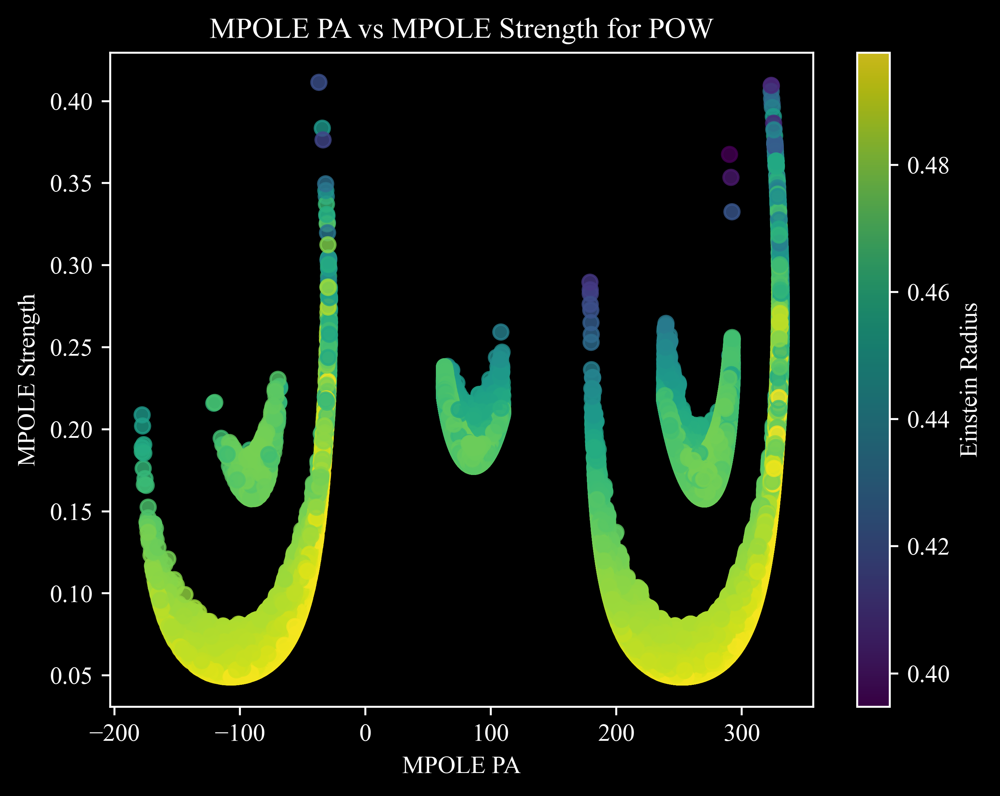

In [13]:
plt.scatter(filtered_df['t_mpole_pa'], filtered_df['t_mpole_str'], c=filtered_df['r_ein'], alpha=0.8)
plt.colorbar(label='Einstein Radius')
plt.xlabel('MPOLE PA', color = 'w')
plt.ylabel('MPOLE Strength', color = 'w')
plt.title('MPOLE PA vs MPOLE Strength for POW')
plt.show()

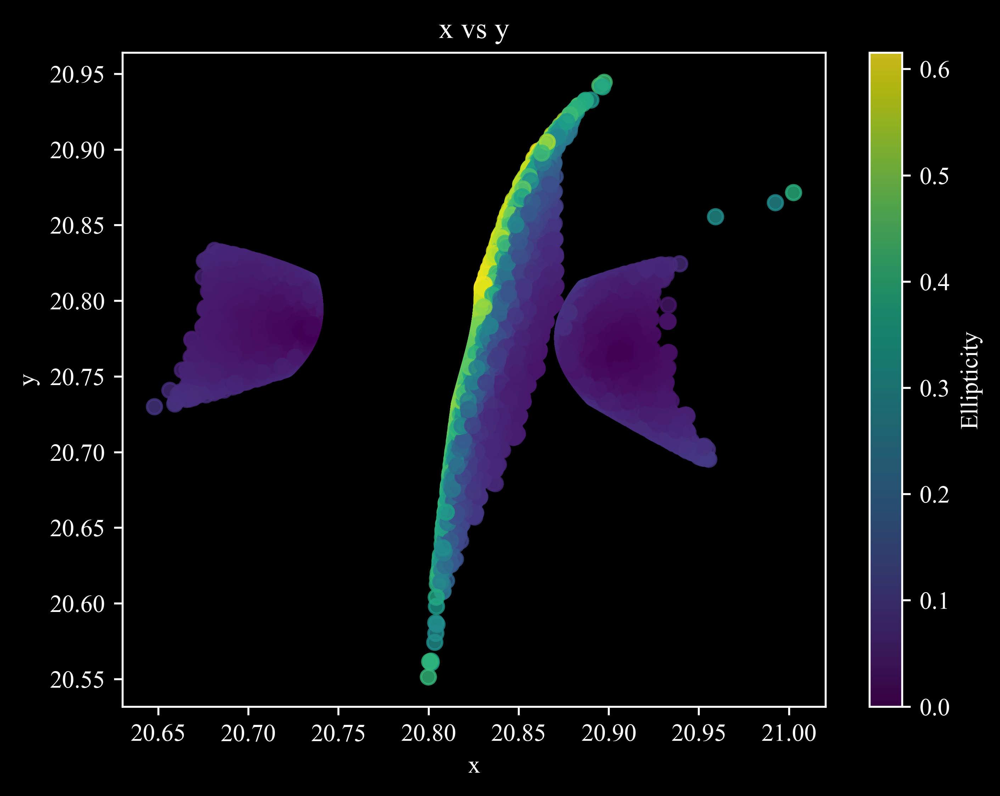

In [16]:
plt.scatter(filtered_df['x'], filtered_df['y'], c=filtered_df['e'], alpha=0.8)
plt.colorbar(label='Ellipticity')
plt.xlabel('x', color = 'w')
plt.ylabel('y', color = 'w')
plt.title('x vs y')
plt.show()

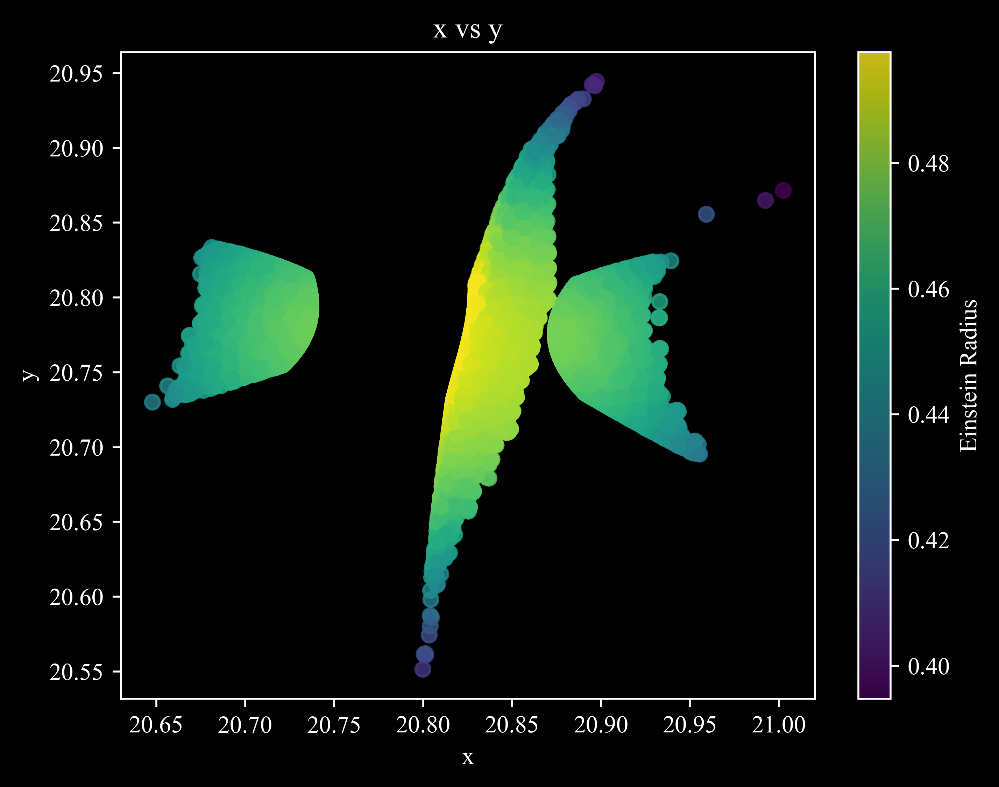

In [18]:
plt.scatter(filtered_df['x'], filtered_df['y'], c=filtered_df['r_ein'], alpha=0.8)
plt.colorbar(label='Einstein Radius')
plt.xlabel('x', color = 'w')
plt.ylabel('y', color = 'w')
plt.title('x vs y')
plt.show()

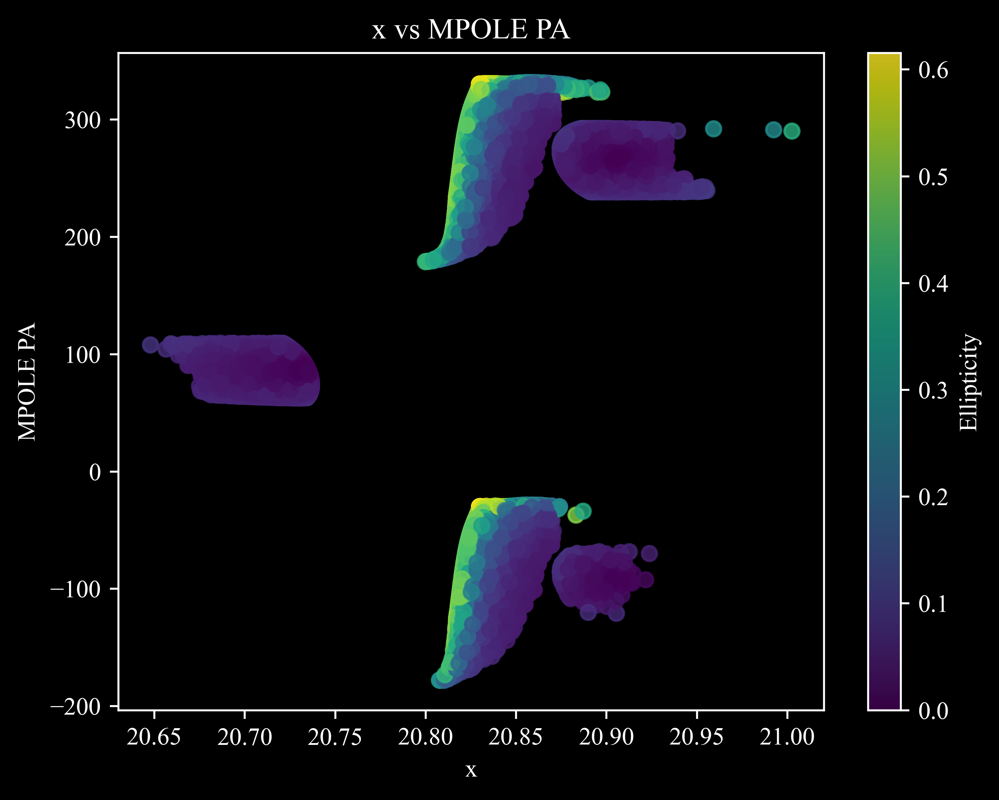

In [19]:
plt.scatter(filtered_df['x'], filtered_df['t_mpole_pa'], c=filtered_df['e'], alpha=0.8)
plt.colorbar(label='Ellipticity')
plt.xlabel('x', color = 'w')
plt.ylabel('MPOLE PA', color = 'w')
plt.title('x vs MPOLE PA')
plt.show()

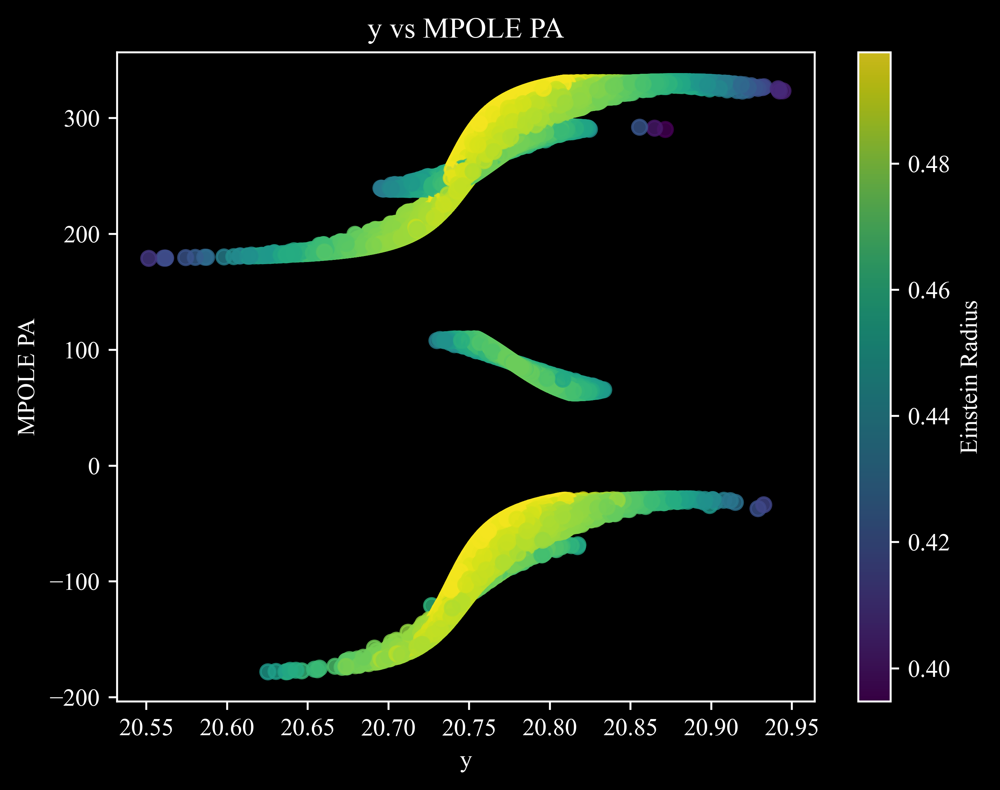

In [20]:
plt.scatter(filtered_df['y'], filtered_df['t_mpole_pa'], c=filtered_df['r_ein'], alpha=0.8)
plt.colorbar(label='Einstein Radius')
plt.xlabel('y', color = 'w')
plt.ylabel('MPOLE PA', color = 'w')
plt.title('y vs MPOLE PA')
plt.show()

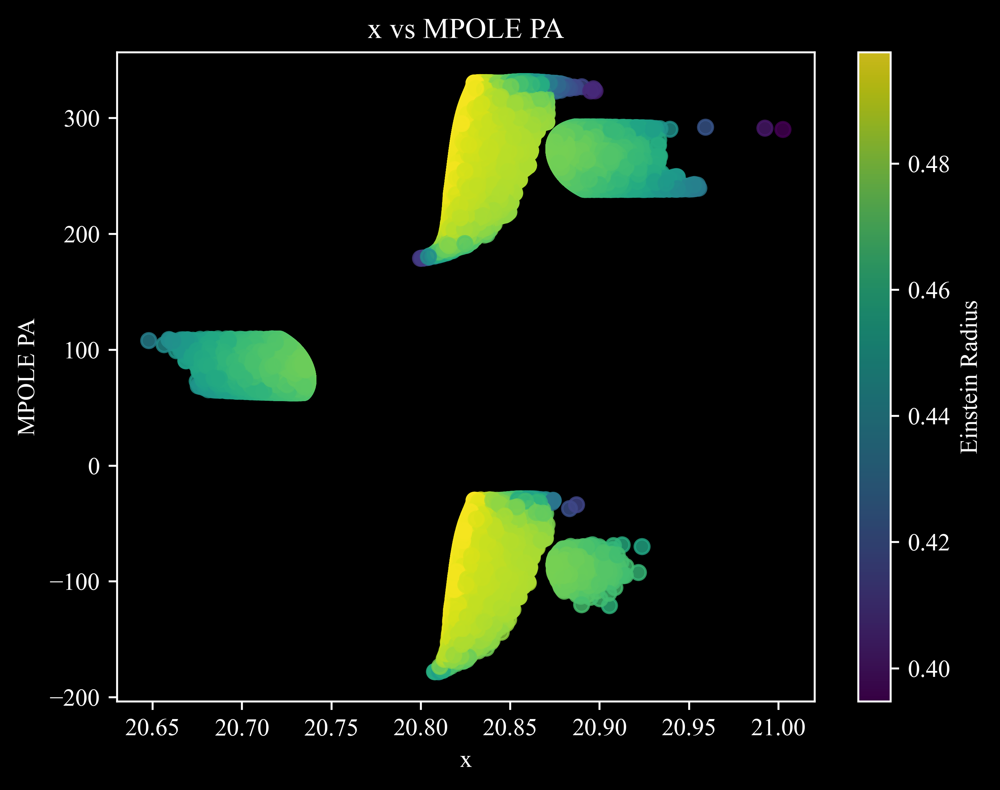

In [21]:
plt.scatter(filtered_df['x'], filtered_df['t_mpole_pa'], c=filtered_df['r_ein'], alpha=0.8)
plt.colorbar(label='Einstein Radius')
plt.xlabel('x', color = 'w')
plt.ylabel('MPOLE PA', color = 'w')
plt.title('x vs MPOLE PA')
plt.show()

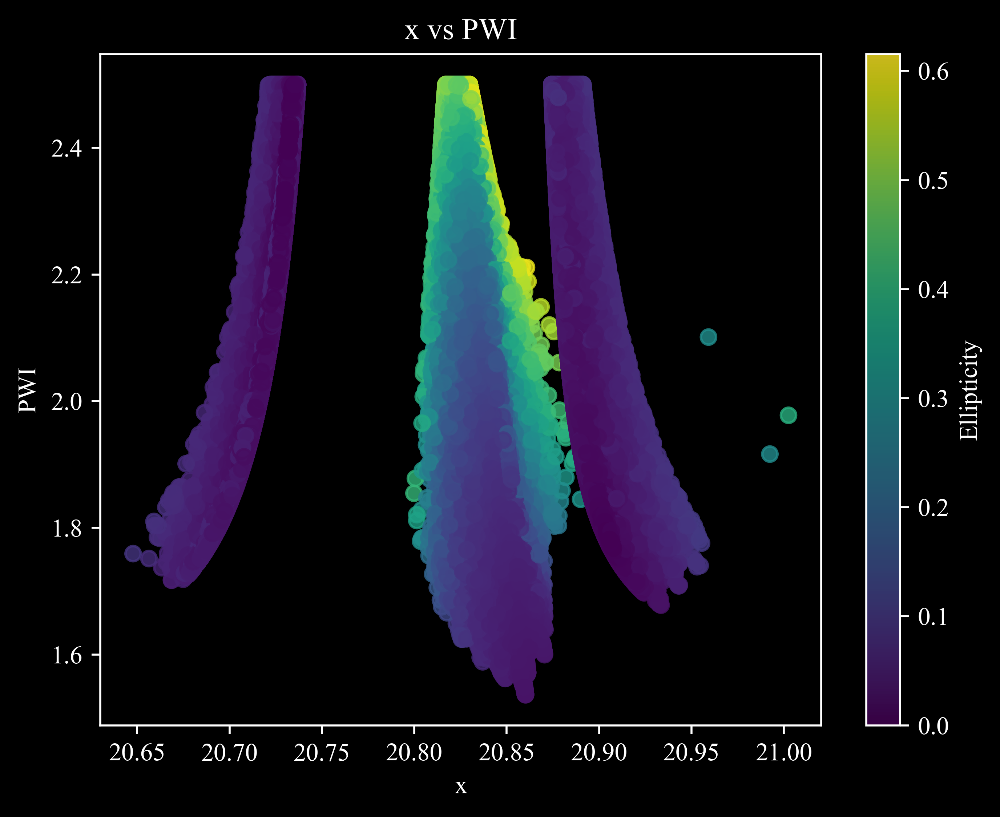

In [22]:
plt.scatter(filtered_df['x'], filtered_df['pwi'], c=filtered_df['e'], alpha=0.8)
plt.colorbar(label='Ellipticity')
plt.xlabel('x', color = 'w')
plt.ylabel('PWI', color = 'w')
plt.title('x vs PWI')
plt.show()

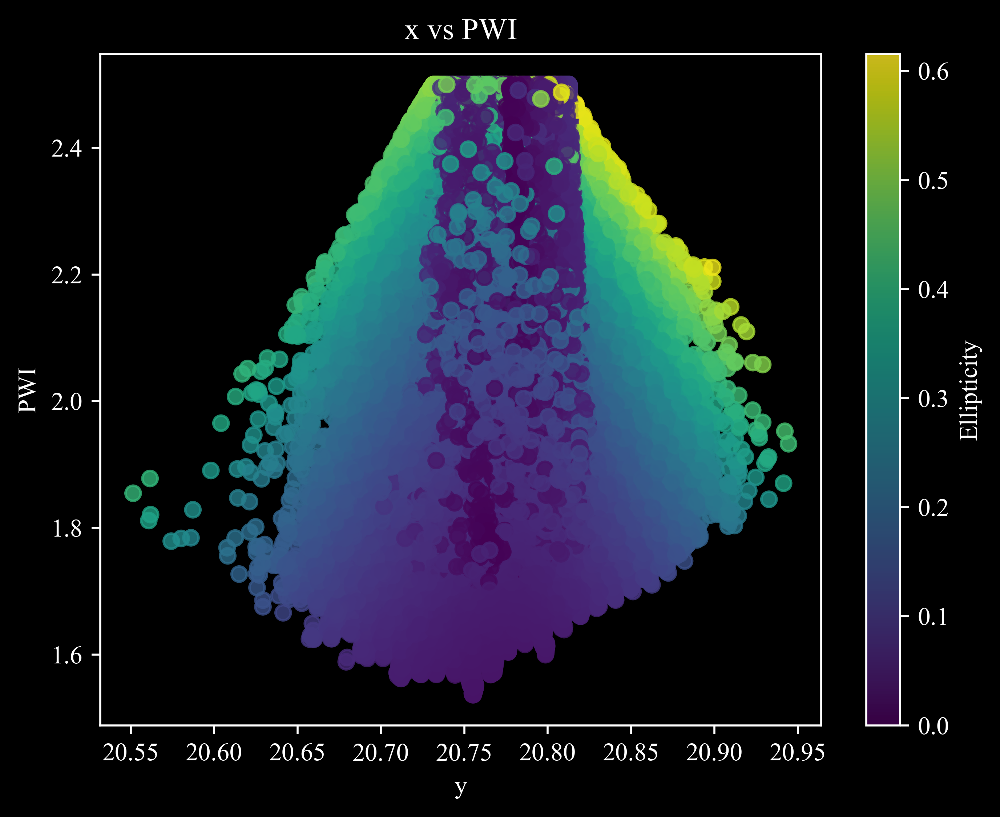

In [25]:
plt.scatter(filtered_df['y'], filtered_df['pwi'], c=filtered_df['e'], alpha=0.8)
plt.colorbar(label='Ellipticity')
plt.xlabel('y', color = 'w')
plt.ylabel('PWI', color = 'w')
plt.title('x vs PWI')
plt.show()

In [29]:
# # Create the 3D scatter plot using plotly express
# fig = px.scatter_3d(filtered_df, 
#                     x='x', 
#                     y='y', 
#                     z='pwi',
#                     color='e',
#                     opacity=1,
#                     title='x vs y vs PWI')

# # Update layout for dark theme, bigger size and smaller points
# fig.update_layout(
#     paper_bgcolor='black',
#     plot_bgcolor='black',
#     scene=dict(
#         xaxis_title='x',
#         yaxis_title='y',
#         zaxis_title='PWI',
#         bgcolor='black',
#         xaxis=dict(gridcolor='white', showbackground=False, color='white'),
#         yaxis=dict(gridcolor='white', showbackground=False, color='white'),
#         zaxis=dict(gridcolor='white', showbackground=False, color='white'),
#         aspectmode='cube'
#     ),
#     font=dict(color='white'),
#     width=1200,  # Increase width
#     height=1000  # Increase height
# )

# # Update marker size
# fig.update_traces(marker=dict(size=5))  # Decrease point size
# fig.write_html("/Users/ainsleylewis/Library/CloudStorage/OneDrive-TheUniversityofHongKong-Connect/Weird Plots/plot_10.html")

# fig.show()

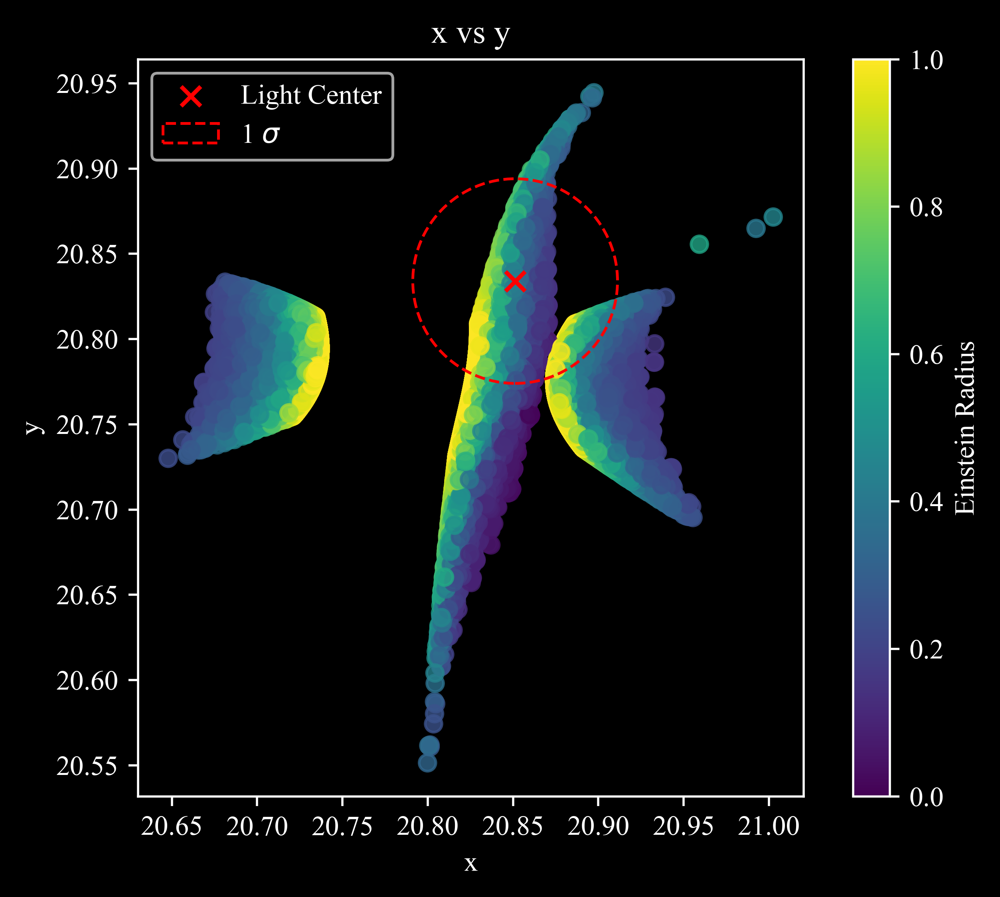

In [ ]:
plt.scatter(filtered_df['x'], filtered_df['y'], c=filtered_df['pwi'], alpha=0.8)
plt.scatter(20.8512217, 20.8340052, c='r', marker='x', s=50, label='Light Center')
circle = plt.Circle((20.8512217, 20.8340052), radius=0.06, color='r', fill=False, linewidth=1, label='1 $\sigma$', linestyle='dashed')
plt.gca().add_patch(circle)
plt.gca().set_aspect('equal', adjustable='box')
plt.colorbar(label='Einstein Radius')
plt.xlabel('x', color = 'w')
plt.ylabel('y', color = 'w')
plt.title('x vs y')
plt.legend()
plt.show()

(array([2.64025e+05, 1.89824e+05, 1.98325e+05, 1.55901e+05, 1.40017e+05,
        3.85700e+04, 1.15400e+04, 1.42500e+03, 2.48000e+02, 6.80000e+01,
        4.10000e+01, 8.00000e+00, 1.00000e+00, 3.00000e+00, 1.00000e+00,
        2.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 1.00000e+00]),
 array([4.20000000e-07, 3.68351890e-02, 7.36699580e-02, 1.10504727e-01,
        1.47339496e-01, 1.84174265e-01, 2.21009034e-01, 2.57843803e-01,
        2.94678572e-01, 3.31513341e-01, 3.68348110e-01, 4.05182879e-01,
        4.42017648e-01, 4.78852417e-01, 5.15687186e-01, 5.52521955e-01,
        5.89356724e-01, 6.26191493e-01, 6.63026262e-01, 6.99861031e-01,
        7.36695800e-01]),
 <BarContainer object of 20 artists>)

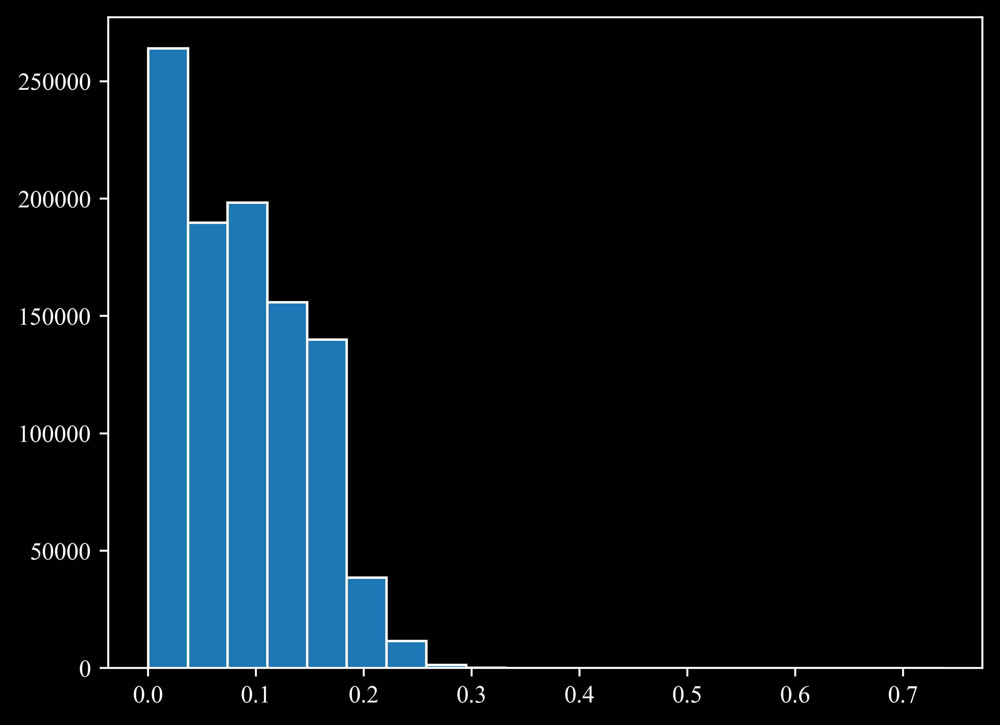

In [17]:
average_shift = abs(df['strength'] - df['t_mpole_str'])
plt.hist(average_shift, bins=20, edgecolor='w')

In [ ]:
def bayes_from_chi2(chi2_model1, chi2_model2, return_log=True):
    """
    Compute log Bayes factor and Bayes factor from chi2 values.

    Parameters
    ----------
    chi2_model1, chi2_model2 : float or array-like
        chi^2 values for model1 and model2. Can be scalars or numpy arrays
        of the same shape (elementwise comparisons).
    return_log : bool
        If True (default) return tuple (logB, B). If False, return B only.

    Returns
    -------
    (logB, B) or B
        logB = ln P(data|M1) - ln P(data|M2) = -0.5*(chi2_1 - chi2_2)
        B    = exp(logB) (odds in favor of M1 over M2)
    """
    chi2_1 = np.array(chi2_model1, dtype=float)
    chi2_2 = np.array(chi2_model2, dtype=float)
    if chi2_1.shape != chi2_2.shape:
        raise ValueError("chi2_model1 and chi2_model2 must have the same shape")

    logB = -0.5 * (chi2_1 - chi2_2)
    B = np.exp(logB)

    return (logB, B) if return_log else B


def interpret_logB(logB, model_names=("Model 1", "Model 2")):
    """
    Interpret log Bayes factor in Jeffreys' scale.
    
    Parameters
    ----------
    logB : float
        log Bayes factor log(B12).
    model_names : tuple of str
        Names of the two models (M1, M2).
    
    Returns
    -------
    str : interpretation of which model is favored and how strongly.
    """
    m1, m2 = model_names
    abs_logB = abs(logB)

    if abs_logB < 1.0:
        strength = "Inconclusive / not worth more than a mention"
    elif abs_logB < 3.0:
        strength = "Substantial evidence"
    elif abs_logB < 5.0:
        strength = "Strong evidence"
    else:
        strength = "Decisive evidence"

    if logB > 0:
        return f"{strength} in favor of {m1}"
    elif logB < 0:
        return f"{strength} in favor of {m2}"
    else:
        return "No preference (logB = 0)"



# ---------------- Example usage ----------------
if __name__ == "__main__":
    chi2_m1 = df['chi2'][0]
    chi2_m2 = df['chi2'][1]

    logB, B = bayes_from_chi2(chi2_m1, chi2_m2)
    print(f"log B (M1 vs M2) = {logB:.4f}")
    print(f"Bayes factor B = {B:.4g}  (odds in favor of M1 over M2)")
    print("Interpretation:", interpret_logB(logB))


log B (M1 vs M2) = -293.4323
Bayes factor B = 3.664e-128  (odds in favor of M1 over M2)
Interpretation: Decisive evidence in favor of Model 2


In [25]:
df

,strength,pa,num_images,pos_rms,mag_rms,t_mpole_str,t_mpole_pa,chi2,z,x,y,e,pow_pa,r_ein,pwi
0,0.001,0.00000,1,0.032746,5.658633e+06,0.000163,-6.996308,586.864500,1.0,20.80811,20.77515,1.290263e-07,92.714100,0.488098,1.503333
1,0.001,0.36036,0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.0,0.00000,0.00000,0.000000e+00,0.000000,0.000000,0.000000
2,0.001,0.72072,0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.0,0.00000,0.00000,0.000000e+00,0.000000,0.000000,0.000000
3,0.001,1.08108,1,0.033757,5.226283e+06,0.000114,7.344973,586.457400,1.0,20.80800,20.77518,8.357626e-08,87.839370,0.487912,1.500765
4,0.001,1.44144,0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.0,0.00000,0.00000,0.000000e+00,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999995,0.100,358.55856,4,0.000031,5.643050e+00,0.176100,325.683900,0.000002,1.0,20.83068,20.79598,5.050464e-01,-3.795002,0.494889,2.477233
999996,0.100,358.91892,4,0.000031,9.254275e+00,0.102399,301.938300,0.000004,1.0,20.84812,20.79003,9.881306e-02,-6.652060,0.486099,1.938562
999997,0.100,359.27928,1,0.054763,1.885863e+05,0.000057,359.988400,586.042100,1.0,20.80799,20.77524,2.713273e-05,14.193040,0.487810,1.500191
999998,0.100,359.63964,5,0.000031,7.182635e+01,0.097083,286.769100,0.000003,1.0,20.87048,20.78544,2.864157e-02,-10.101540,0.483096,1.501340


In [10]:
def infer_N(obs_pos=None, obs_mu=None):
    """
    Infer number of independent data points N from provided observables.

    Parameters
    ----------
    obs_pos : array-like, shape (n_images, 2) or None
        Observed positions (x,y) for each image. If provided, counts 2 per image.
    obs_mu : array-like, shape (n_images,) or None
        Observed magnifications for each image. If provided, counts 1 per image.

    Returns
    -------
    N : int
        Number of independent data points used in chi^2.
    """
    n_pos = 0
    n_mu = 0
    if obs_pos is not None:
        obs_pos = np.asarray(obs_pos)
        if obs_pos.ndim != 2 or obs_pos.shape[1] != 2:
            raise ValueError("obs_pos must be shape (n_images, 2)")
        n_pos = obs_pos.shape[0] * 2
    if obs_mu is not None:
        obs_mu = np.asarray(obs_mu)
        if obs_mu.ndim != 1:
            raise ValueError("obs_mu must be a 1D array of length n_images")
        n_mu = obs_mu.shape[0]
    if (obs_pos is not None) and (obs_mu is not None):
        if obs_pos.shape[0] != obs_mu.shape[0]:
            raise ValueError("obs_pos and obs_mu must have the same number of images")
    N = n_pos + n_mu
    if N == 0:
        raise ValueError("No observables provided (obs_pos and/or obs_mu required)")
    return int(N)


def logB_from_chi2(chi2_1, chi2_2):
    """
    Log Bayes factor from chi^2 when models have same number of params.
    logB = ln P(data|M1) - ln P(data|M2) = -0.5*(chi2_1 - chi2_2)
    """
    chi2_1 = float(chi2_1)
    chi2_2 = float(chi2_2)
    logB = -0.5 * (chi2_1 - chi2_2)
    return logB, float(np.exp(logB))


def logB_from_chi2_with_bic(chi2_1, chi2_2, k1, k2, N):
    """
    Approximate log Bayes factor using BIC to penalize parameter count:
      BIC = chi2 + k*ln(N)
      ln P(data|M) ~ -0.5 * BIC
      logB = -0.5*(BIC1 - BIC2)
    """
    chi2_1 = float(chi2_1); chi2_2 = float(chi2_2)
    BIC1 = chi2_1 + k1 * np.log(N)
    BIC2 = chi2_2 + k2 * np.log(N)
    logB = -0.5 * (BIC1 - BIC2)
    return logB, float(np.exp(logB))


def interpret_logB(logB, names=("Model 1", "Model 2")):
    """
    Human-readable interpretation (Jeffreys-like).
    """
    m1, m2 = names
    abs_logB = abs(logB)
    if abs_logB < 1.0:
        strength = "Inconclusive / not worth more than a mention"
    elif abs_logB < 3.0:
        strength = "Substantial evidence"
    elif abs_logB < 5.0:
        strength = "Strong evidence"
    else:
        strength = "Decisive / very strong evidence"

    if logB > 0:
        return f"{strength} in favor of {m1} (logB={logB:.3f})"
    elif logB < 0:
        return f"{strength} in favor of {m2} (logB={logB:.3f})"
    else:
        return "No preference (logB = 0)"


# ---------------- Example usage ----------------
if __name__ == "__main__":
    # Example: 4 lensed images, we measured positions and magnifications
    obs_pos = np.array([[20.77773, 20.30254],
                        [21.27308, 20.95612],
                        [20.39091, 21.05057],
                        [20.81981, 21.25931]])
    obs_mu = np.array([4.27, 6.80, 5.98, 15.3])

    # infer N automatically
    N = infer_N(obs_pos=obs_pos, obs_mu=obs_mu)   # -> 3*4 = 12
    print("Inferred N =", N)

    # Suppose these are your precomputed chi^2 values
    chi2_m1 = 1.883599e+02   # model 1
    chi2_m2 = df['chi2'][2]   # model 2

    # Equal-parameter comparison
    logB, B = logB_from_chi2(chi2_m1, chi2_m2)
    print("Equal-params: logB = {:.3f}, B = {:.3g}".format(logB, B))
    print(interpret_logB(logB, ("Lens M1", "Lens M2")))

    # If models have different parameters, use BIC:
    k1 = 8   # number of params in model 1
    k2 = 13   # number of params in model 2
    logB_bic, B_bic = logB_from_chi2_with_bic(chi2_m1, chi2_m2, k1, k2, N)
    print("BIC-penalized: logB = {:.3f}, B = {:.3g}".format(logB_bic, B_bic))
    print(interpret_logB(logB_bic, ("Lens M1", "Lens M2")))


Inferred N = 12
Equal-params: logB = -94.180, B = 1.25e-41
Decisive / very strong evidence in favor of Lens M2 (logB=-94.180)
BIC-penalized: logB = -87.968, B = 6.25e-39
Decisive / very strong evidence in favor of Lens M2 (logB=-87.968)


In [ ]:
obs_pos = np.array([[20.77773, 20.30254],
                    [21.27308, 20.95612],
                    [20.39091, 21.05057],
                    [20.81981, 21.25931]])
obs_mu = np.array([4.27, 6.80, 5.98, 15.3])

# infer N automatically
N = infer_N(obs_pos=obs_pos, obs_mu=obs_mu)   # -> 3*4 = 12
print("Inferred N =", N)

logB_bic_list_pow = []

if __name__ == "__main__":
    for i in tqdm.tqdm(range(len(df))):
        # Suppose these are your precomputed chi^2 values
        chi2_m1 = 1.883599e+02   # model 1
        chi2_m2 = df['chi2'][i]   # model 2

        k1 = 8  
        k2 = 13 
        logB_bic, B_bic = logB_from_chi2_with_bic(chi2_m1, chi2_m2, k1, k2, N)
        logB_bic_list_pow.append(logB_bic)


Inferred N = 12


100%|██████████| 1000000/1000000 [00:04<00:00, 239625.08it/s]


In [ ]:
df['logB_bic_pow'] = logB_bic_list_pow

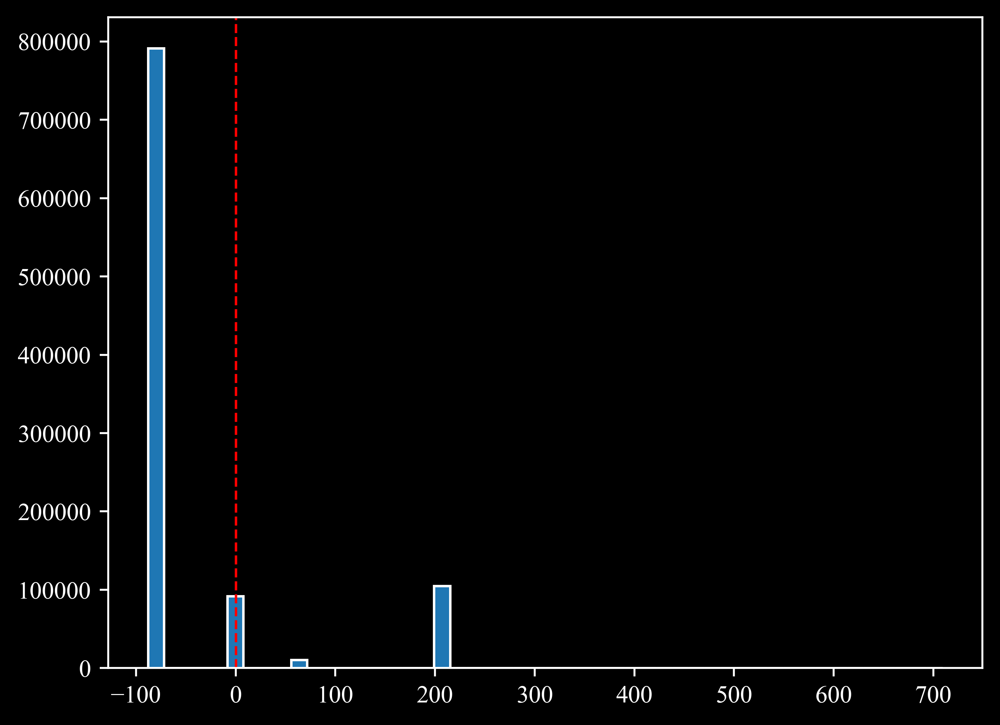

In [ ]:
plt.hist(df['logB_bic_pow'], bins=50, edgecolor='w')
plt.axvline(0, color='r', linestyle='dashed', linewidth=1)

In [ ]:
# Percentage of models where the pow law is prefered
negative_logB_bic = len(df['logB_bic_pow'][df['logB_bic_pow'] < 0])
percentage_pow_pref = negative_logB_bic / len(df['logB_bic_pow']) * 100

print(f"Percentage of models where POW is preferred over MPOLE: {percentage_pow_pref:.2f}%")

Percentage of models where POW is preferred over MPOLE: 79.70%


In [28]:
obs_pos = np.array([[20.77773, 20.30254],
                    [21.27308, 20.95612],
                    [20.39091, 21.05057],
                    [20.81981, 21.25931]])
obs_mu = np.array([4.27, 6.80, 5.98, 15.3])

# infer N automatically
N = infer_N(obs_pos=obs_pos, obs_mu=obs_mu)   # -> 3*4 = 12
print("Inferred N =", N)

logB_bic_list_shear = []

if __name__ == "__main__":
    for i in tqdm.tqdm(range(len(df))):
        # Suppose these are your precomputed chi^2 values
        chi2_m1 = 2.403929e-06   # model 1
        chi2_m2 = df['chi2'][i]   # model 2

        k1 = 12  
        k2 = 13 
        logB_bic, B_bic = logB_from_chi2_with_bic(chi2_m1, chi2_m2, k1, k2, N)
        logB_bic_list_shear.append(logB_bic)


Inferred N = 12


 16%|█▌        | 155658/1000000 [00:00<00:03, 244509.19it/s]/var/folders/tm/964hg0yn70x0ddsqcj4bsf8r0000gn/T/ipykernel_36265/3340223689.py:60: RuntimeWarning: overflow encountered in exp
  return logB, float(np.exp(logB))
100%|██████████| 1000000/1000000 [00:04<00:00, 244228.04it/s]


In [29]:
df['logB_bic_shear'] = logB_bic_list_shear

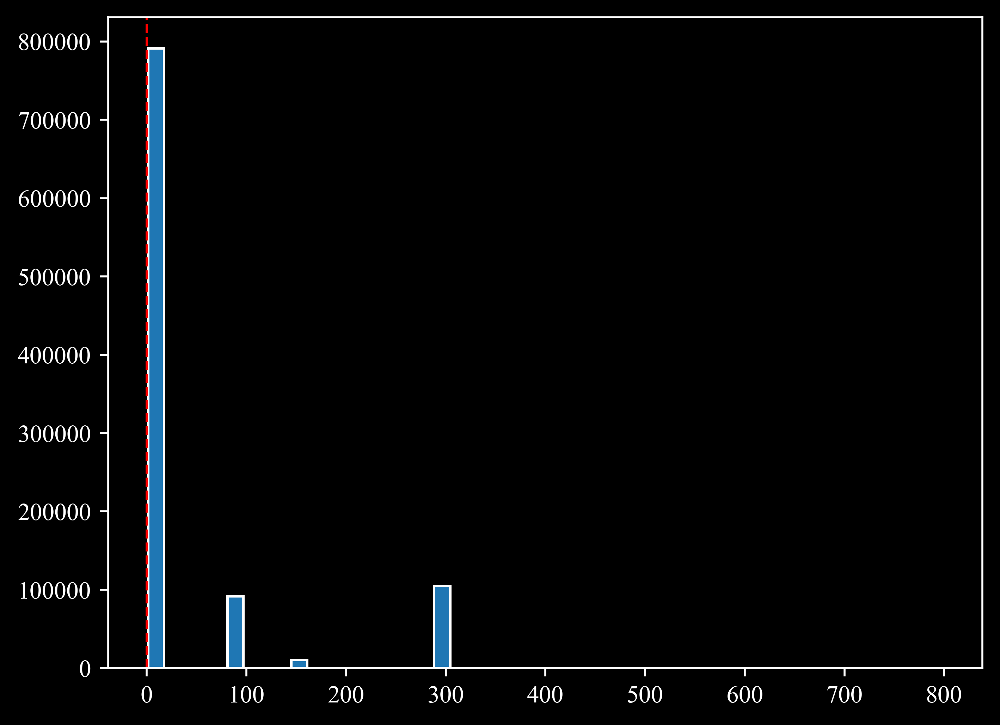

In [30]:
plt.hist(df['logB_bic_shear'], bins=50, edgecolor='w')
plt.axvline(0, color='r', linestyle='dashed', linewidth=1)

In [31]:
# Percentage of models where the pow law is prefered
negative_logB_bic = len(df['logB_bic_shear'][df['logB_bic_shear'] < 0])
percentage_pow_pref = negative_logB_bic / len(df['logB_bic_shear']) * 100

print(f"Percentage of models where POW+SHEAR is preferred over MPOLE: {percentage_pow_pref:.2f}%")

Percentage of models where POW+SHEAR is preferred over MPOLE: 0.00%


In [32]:
obs_pos = np.array([[20.77773, 20.30254],
                    [21.27308, 20.95612],
                    [20.39091, 21.05057],
                    [20.81981, 21.25931]])
obs_mu = np.array([4.27, 6.80, 5.98, 15.3])

# infer N automatically
N = infer_N(obs_pos=obs_pos, obs_mu=obs_mu)   # -> 3*4 = 12
print("Inferred N =", N)

logB_bic_list_shear_fix = []

if __name__ == "__main__":
    for i in tqdm.tqdm(range(len(df))):
        # Suppose these are your precomputed chi^2 values
        chi2_m1 = 2.178829e-06   # model 1
        chi2_m2 = df['chi2'][i]   # model 2

        k1 = 9  
        k2 = 13 
        logB_bic, B_bic = logB_from_chi2_with_bic(chi2_m1, chi2_m2, k1, k2, N)
        logB_bic_list_shear_fix.append(logB_bic)


Inferred N = 12


 15%|█▌        | 152840/1000000 [00:00<00:03, 221853.03it/s]/var/folders/tm/964hg0yn70x0ddsqcj4bsf8r0000gn/T/ipykernel_36265/3340223689.py:60: RuntimeWarning: overflow encountered in exp
  return logB, float(np.exp(logB))
100%|██████████| 1000000/1000000 [00:04<00:00, 233831.87it/s]


In [33]:
df['logB_bic_shear_fix'] = logB_bic_list_shear_fix

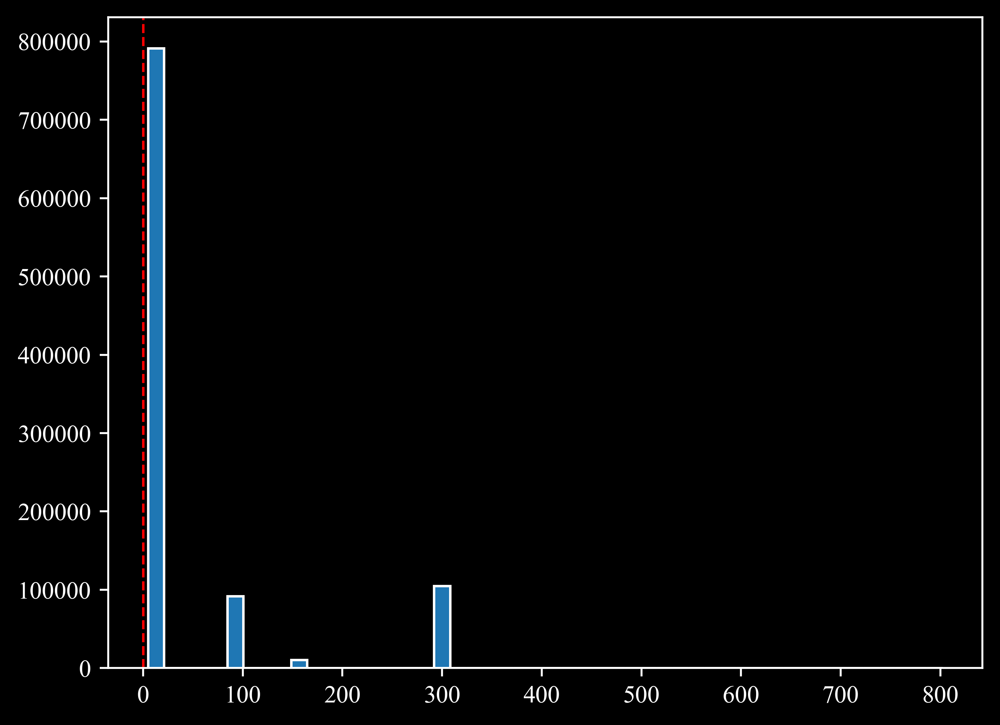

In [34]:
plt.hist(df['logB_bic_shear_fix'], bins=50, edgecolor='w')
plt.axvline(0, color='r', linestyle='dashed', linewidth=1)

In [35]:
# Percentage of models where the pow law is prefered
negative_logB_bic = len(df['logB_bic_shear_fix'][df['logB_bic_shear_fix'] < 0])
percentage_pow_pref = negative_logB_bic / len(df['logB_bic_shear_fix']) * 100

print(f"Percentage of models where POW+SHEAR+FIX is preferred over MPOLE: {percentage_pow_pref:.2f}%")

Percentage of models where POW+SHEAR+FIX is preferred over MPOLE: 0.00%


In [40]:
obs_pos = np.array([[20.77773, 20.30254],
                    [21.27308, 20.95612],
                    [20.39091, 21.05057],
                    [20.81981, 21.25931]])
obs_mu = np.array([4.27, 6.80, 5.98, 15.3])

# infer N automatically
N = infer_N(obs_pos=obs_pos, obs_mu=obs_mu)   # -> 3*4 = 12
print("Inferred N =", N)

logB_bic_list_mpole = []

if __name__ == "__main__":
    for i in tqdm.tqdm(range(len(df))):
        # Suppose these are your precomputed chi^2 values
        chi2_m1 = 2.488578e-06   # model 1
        chi2_m2 = df['chi2'][i]   # model 2

        k1 = 13  
        k2 = 13 
        logB_bic, B_bic = logB_from_chi2_with_bic(chi2_m1, chi2_m2, k1, k2, N)
        logB_bic_list_mpole.append(logB_bic)


Inferred N = 12


 15%|█▍        | 146056/1000000 [00:00<00:03, 249573.75it/s]/var/folders/tm/964hg0yn70x0ddsqcj4bsf8r0000gn/T/ipykernel_36265/3340223689.py:60: RuntimeWarning: overflow encountered in exp
  return logB, float(np.exp(logB))
100%|██████████| 1000000/1000000 [00:03<00:00, 253508.17it/s]


In [41]:
df['logB_bic_mpole'] = logB_bic_list_mpole

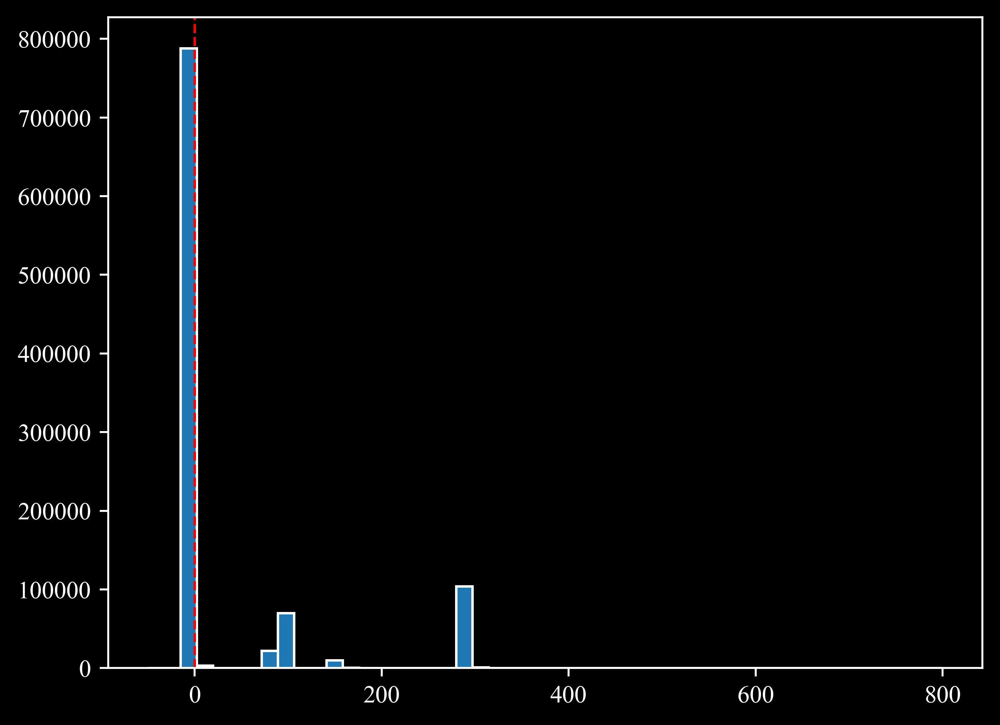

In [49]:
bins = np.linspace(-50, 800, 50)
plt.hist(df['logB_bic_mpole'], bins=bins, edgecolor='w')
plt.axvline(0, color='r', linestyle='dashed', linewidth=1)

In [50]:
# Percentage of models where the pow law is prefered
negative_logB_bic = len(df['logB_bic_mpole'][df['logB_bic_mpole'] < 0])
percentage_pow_pref = negative_logB_bic / len(df['logB_bic_mpole']) * 100

print(f"Percentage of models where POW+MPOLE (Order 1) is preferred over MPOLE: {percentage_pow_pref:.2f}%")

Percentage of models where POW+MPOLE (Order 1) is preferred over MPOLE: 55.19%


In [51]:
df

,strength,pa,num_images,pos_rms,mag_rms,t_mpole_str,t_mpole_pa,chi2,z,x,y,e,pow_pa,r_ein,pwi,logB_bic,logB_bic_shear,logB_bic_shear_fix,logB_bic_mpole
0,0.001,0.00000,1,0.032746,5.658633e+06,0.000163,-6.996308,586.864500,1.0,20.80811,20.77515,1.290263e-07,92.714100,0.488098,1.503333,205.464567,294.674702,298.402062,2.934322e+02
1,0.001,0.36036,0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.0,0.00000,0.00000,0.000000e+00,0.000000,0.000000,0.000000,-87.967683,1.242452,4.969812,-1.244289e-06
2,0.001,0.72072,0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.0,0.00000,0.00000,0.000000e+00,0.000000,0.000000,0.000000,-87.967683,1.242452,4.969812,-1.244289e-06
3,0.001,1.08108,1,0.033757,5.226283e+06,0.000114,7.344973,586.457400,1.0,20.80800,20.77518,8.357626e-08,87.839370,0.487912,1.500765,205.261017,294.471152,298.198512,2.932287e+02
4,0.001,1.44144,0,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.0,0.00000,0.00000,0.000000e+00,0.000000,0.000000,0.000000,-87.967683,1.242452,4.969812,-1.244289e-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999995,0.100,358.55856,4,0.000031,5.643050e+00,0.176100,325.683900,0.000002,1.0,20.83068,20.79598,5.050464e-01,-3.795002,0.494889,2.477233,-87.967682,1.242453,4.969813,-1.436930e-07
999996,0.100,358.91892,4,0.000031,9.254275e+00,0.102399,301.938300,0.000004,1.0,20.84812,20.79003,9.881306e-02,-6.652060,0.486099,1.938562,-87.967682,1.242454,4.969814,6.240250e-07
999997,0.100,359.27928,1,0.054763,1.885863e+05,0.000057,359.988400,586.042100,1.0,20.80799,20.77524,2.713273e-05,14.193040,0.487810,1.500191,205.053367,294.263502,297.990862,2.930210e+02
999998,0.100,359.63964,5,0.000031,7.182635e+01,0.097083,286.769100,0.000003,1.0,20.87048,20.78544,2.864157e-02,-10.101540,0.483096,1.501340,-87.967682,1.242453,4.969814,1.100115e-07
